# BeamRider - DQN

## Instalación e importación de librerías

In [1]:
!pip install stable_baselines3 # DQN
!pip install sb3-contrib # QR-DQN
!pip install ale-py
!pip install "gymnasium[atari,accept-rom-license]" stable-baselines3 autorom renderlab -q
!AutoROM --accept-license
!pip install renderlab

# Librerías y utilidades RL
import stable_baselines3
from stable_baselines3 import DQN
from stable_baselines3.common.logger import configure
from stable_baselines3.common.logger import Logger, CSVOutputFormat, HumanOutputFormat
from stable_baselines3.common.evaluation import evaluate_policy
from sb3_contrib import QRDQN
import gymnasium
import renderlab

import ale_py
from gymnasium.wrappers import TimeLimit
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack
from collections import deque
import cv2

#!Importante:
gymnasium.register_envs(ale_py)

#Otras librerías básicas
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import pandas as pd
import sys

import os
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback

#Limpia los registros generados
from IPython.display import clear_output
clear_output()
print("Todas las librerías han sido instaladas correctamente.")

Todas las librerías han sido instaladas correctamente.


In [2]:
import subprocess
subprocess.run(["AutoROM"], input="Y\n", text=True)

  return datetime.utcnow().replace(tzinfo=utc)



CompletedProcess(args=['AutoROM'], returncode=0)

## Callback

In [3]:
# Callback para el registro de recompensas y backup del mejor modelo
class RewardLoggerCallback(BaseCallback):
    def __init__(self, path_backup: str = None, usar_media: bool = True, ventana_para_media: int = 100, verbose: bool = True):
        """
        path_backup: ruta donde se guarda el mejor modelo
        usar_media: si True, compara la media de los últimos `ventana_para_media` episodios; si False usa recompensa individual
        ventana_para_media: tamaño de la ventana para la media (si usar_media=True)
        """
        super().__init__(verbose)
        self.episode_rewards = []
        self.best_score = -np.inf
        self.path_backup = path_backup
        self.usar_media = usar_media
        self.ventana_para_media = ventana_para_media

    def _on_step(self) -> bool:
        infos = self.locals.get("infos", [])
        if not infos:
            return True

        for info in infos:
            ep = info.get("episode")
            if ep is None:
                continue
            r = ep.get("r")
            # Registra la recompensa del episodio
            self.episode_rewards.append(r)

            # Decide recompensa individual vs. promedio móvil
            if self.usar_media:
                if len(self.episode_rewards) >= self.ventana_para_media:
                    score = float(np.mean(self.episode_rewards[-self.ventana_para_media:]))
                else:
                    score = float(np.mean(self.episode_rewards))
            else:
                score = float(r)

            # Si hay mejora, guarda el modelo
            if score > self.best_score:
                self.best_score = score
                if self.path_backup:
                    # Checks (directorios)
                    dirname = os.path.dirname(self.path_backup)
                    if dirname and not os.path.exists(dirname):
                        os.makedirs(dirname, exist_ok=True)
                    try:
                        # Guardar como <path_backup>.zip
                        self.model.save(self.path_backup)
                        if self.verbose:
                            print(f"[RewardLoggerCallback] Nuevo mejor score {score:.2f} -> Guardado en: {self.path_backup}.zip")
                    except Exception as e:
                        print(f"[RewardLoggerCallback] Error al guardar el modelo: {e}")

        return True

## Trainer

In [4]:
class Trainer:
    def __init__(
        self, model_fn, mode=0, difficulty=0, total_timesteps=500_000, log_dir="./logs",
        path_mejor_modelo=None, usar_media_guardar=True, ventana_para_media=100,

    ):
        self.mode = mode  # Modo del entorno (por defecto 0)
        self.difficulty = difficulty  # Dificultad del entorno (por defecto 0)
        self.total_timesteps = total_timesteps  # Número total de pasos de entrenamiento
        self.log_dir = log_dir  # Carpeta donde se almacenan los logs
        os.makedirs(log_dir, exist_ok=True)  # Crea la carpeta si no existe

        # Crea el entorno Atari con envolturas necesarias
        env = make_atari_env(
            "ALE/BeamRider-v5",
            n_envs=1,
            seed=0,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty}
        )
        env = VecFrameStack(env, n_stack=4)  # Apila 4 frames para entradas más ricas
        env.envs[0] = Monitor(env.envs[0], filename=os.path.join(log_dir, "monitor.csv"))  # Guarda estadísticas del entorno

        self.env = env
        self.model = model_fn(self.env)  # Crea el modelo usando la función proporcionada

        # Configura un logger personalizado que guarda en consola y en CSV
        new_logger = configure(log_dir, ["stdout", "csv", "tensorboard"])
        self.model.set_logger(new_logger)

        # Ruta por defecto
        if path_mejor_modelo is None:
            path_mejor_modelo = os.path.join("./", "best_model")

        # Callback que guardará el mejor modelo
        self.callback = RewardLoggerCallback(path_backup=path_mejor_modelo,
                                             usar_media=usar_media_guardar,
                                             ventana_para_media=ventana_para_media,
                                             verbose=1)
    # Entrena el modelo y guarda el archivo resultante
    def train(self, path_final="model_final"):
        self.model.learn(total_timesteps=self.total_timesteps, log_interval=20, callback=self.callback)
        self.model.save(path_final)
        print("Training complete. Model saved.")  # Mensaje al finalizar

    # Grafica la evolución de las recompensas por episodio
    def plot_rewards(self):
        if not self.callback.episode_rewards:
            print("No reward data to plot.")  # Si no hay datos, notifica
            return
        plt.figure(figsize=(10, 5))
        plt.plot(self.callback.episode_rewards, label="Episode Reward")
        plt.xlabel("Episodes")
        plt.ylabel("Reward")
        plt.title("Training Rewards Over Time")
        plt.grid()
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Carga el modelo entrenado y genera un video del agente actuando
    def generate_video(self, model_path="DQN_BeamRider_final"):
        model = self.model.__class__.load(model_path)

        # Crea el entorno con modo de renderizado RGB para capturar imágenes
        env = gymnasium.make("ALE/BeamRider-v5", render_mode="rgb_array", mode=self.mode, difficulty=self.difficulty)
        env = renderlab.RenderFrame(env, "./output")  # Envuelve el entorno para capturar video

        frame_stack = deque(maxlen=4)  # Pila de frames para mantener la entrada en el mismo formato que durante el entrenamiento

        # Función para preprocesar las observaciones: convierte a escala de grises y redimensiona
        def preprocess(obs):
            gray = obs.mean(axis=2).astype(np.uint8)
            resized = cv2.resize(gray, (84, 84), interpolation=cv2.INTER_AREA)
            return resized

        obs, info = env.reset()

        preprocessed = preprocess(obs)
        for _ in range(4):
            frame_stack.append(preprocessed)  # Inicializa la pila con los primeros 4 frames

        terminated = False
        truncated = False
        total_reward = 0  # Acumula la recompensa total del episodio

        # Ejecuta el episodio hasta que termine
        while not (terminated or truncated):
            stacked_obs = np.stack(frame_stack, axis=0)  # Apila los frames para la entrada del modelo
            action, _ = model.predict(stacked_obs, deterministic=True)  # Predice la acción a tomar

            obs, reward, terminated, truncated, info = env.step(action)  # Ejecuta la acción
            total_reward += reward  # Acumula la recompensa

            preprocessed = preprocess(obs)  # Preprocesa la nueva observación
            frame_stack.append(preprocessed)  # Actualiza la pila de frames

        print("Recompensa obtenida en el episodio:", total_reward)  # Muestra la recompensa obtenida
        env.play()  # Reproduce el video generado

## DQN



In [5]:
# Función auxiliar para crear el modelo
def create_model(env):
    return DQN(
        "CnnPolicy",
        env,
        learning_rate=3e-5,
        buffer_size=100_000,
        learning_starts=1024,
        batch_size=64*2,
        gamma=0.95,
        train_freq=4,
        target_update_interval=5_000,
        exploration_fraction=0.80,
        exploration_initial_eps=0.65,
        exploration_final_eps=0.10,
        tensorboard_log="./logs",
        verbose=1
    )

## Entrenamiento

In [6]:
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

  return datetime.utcnow().replace(tzinfo=utc)



In [7]:
trainerDQN = Trainer(model_fn=create_model, mode=0, difficulty=0, total_timesteps=2_000_000)

Using cuda device
Wrapping the env in a VecTransposeImage.


  return datetime.utcnow().replace(tzinfo=utc)



Logging to ./logs


In [8]:
trainerDQN.train()

Streaming output truncated to the last 5000 lines.
|    fps              | 159      |
|    time_elapsed     | 3803     |
|    total_timesteps  | 608131   |
| train/              |          |
|    learning_rate    | 3e-05    |
|    loss             | 0.0198   |
|    n_updates        | 151776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 162      |
|    ep_rew_mean      | 7.13     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 4900     |
|    fps              | 159      |
|    time_elapsed     | 3823     |
|    total_timesteps  | 611323   |
| train/              |          |
|    learning_rate    | 3e-05    |
|    loss             | 0.0194   |
|    n_updates        | 152574   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 159      |
|    ep_rew_mean      | 7.15     |
|   

## Plot de rewards y Video

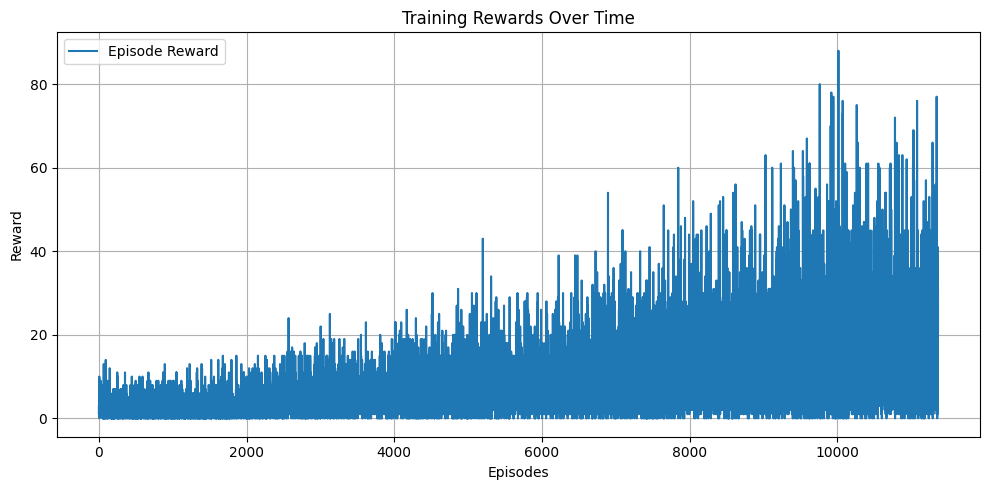

In [9]:
trainerDQN.plot_rewards()

In [14]:
trainerDQN.generate_video("./best_model")

  warnings.warn(



Recompensa obtenida en el episodio: 1092.0
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


In [13]:
trainerDQN.generate_video("./model_final")

  warnings.warn(



Recompensa obtenida en el episodio: 900.0
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



t:  98%|█████████▊| 1815/1851 [00:05<00:00, 358.76it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file ./output/1756691557.3397217.mp4, 100800 bytes wanted but 0 bytes read,at frame 1850/1851, at time 61.67/61.67 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


# Referencias

[1] Gym Docs BeamRider https://ale.farama.org/environments/beam_rider/

[2] Stable Baselines3 Documentation, DQN. https://stable-baselines3.readthedocs.io/en/master/modules/dqn.html